In [4]:
import pandas as pd 
from sklearn.linear_model import LinearRegression
from sklearn.metrics import mean_squared_error, mean_absolute_error
import numpy as np 
from matplotlib import pyplot as plt
from utils import *


In [23]:
dataset_path = "data-science-summer-intern-2021/orders_autumn_2020.csv"
data = pd.read_csv(dataset_path).dropna()

add_hours_mins_cols(data)
add_distance_col(data)

print(data.columns)
X_names = ["ITEM_COUNT",
        "DISTANCES_KM",
        "ESTIMATED_DELIVERY_MINUTES"р
        "WIND_SPEED", "TEMPERATURE"]

Y_names = ["ACTUAL_DELIVERY_MINUTES"]

X = data[X_names]
Y = data[Y_names]


(18429, 4)
[0.59968782 1.17992593 1.39110364 0.55631779 3.30509173]
Index(['DISTANCES_KM', 'TIMESTAMP_MINUTES', 'TIMESTAMP_HOURS', 'TIMESTAMP',
       'ACTUAL_DELIVERY_MINUTES - ESTIMATED_DELIVERY_MINUTES', 'ITEM_COUNT',
       'USER_LAT', 'USER_LONG', 'VENUE_LAT', 'VENUE_LONG',
       'ESTIMATED_DELIVERY_MINUTES', 'ACTUAL_DELIVERY_MINUTES',
       'CLOUD_COVERAGE', 'TEMPERATURE', 'WIND_SPEED', 'PRECIPITATION'],
      dtype='object')


In [24]:
def scatter_all_parameters(y, x):

    # plot actual delivery against:
    # - item count 
    # - distance_km 
    # - timestamp hours 
    # - timestampt mins 
    # - wind speed 
    # - precipitation 
    # - cloud coverage 
    # - temperature 
    # - estimated delivery in minutes

    col_names = ["ITEM_COUNT", "DISTANCES_KM", "TIMESTAMP_HOURS", "TIMESTAMP_MINUTES",
                "WIND_SPEED", "PRECIPITATION", "CLOUD_COVERAGE", "TEMPERATURE", 
                "ESTIMATED_DELIVERY_MINUTES"]

    fig, axs = plt.subplots(nrows=3, ncols=3, figsize=(15,15))
    for i, ax in enumerate(axs.flat):
        
        scatter_x = x[col_names[i]]
        scatter_y = y
        ax.scatter(scatter_x, scatter_y)
        ax.set_title(col_names[i])

    

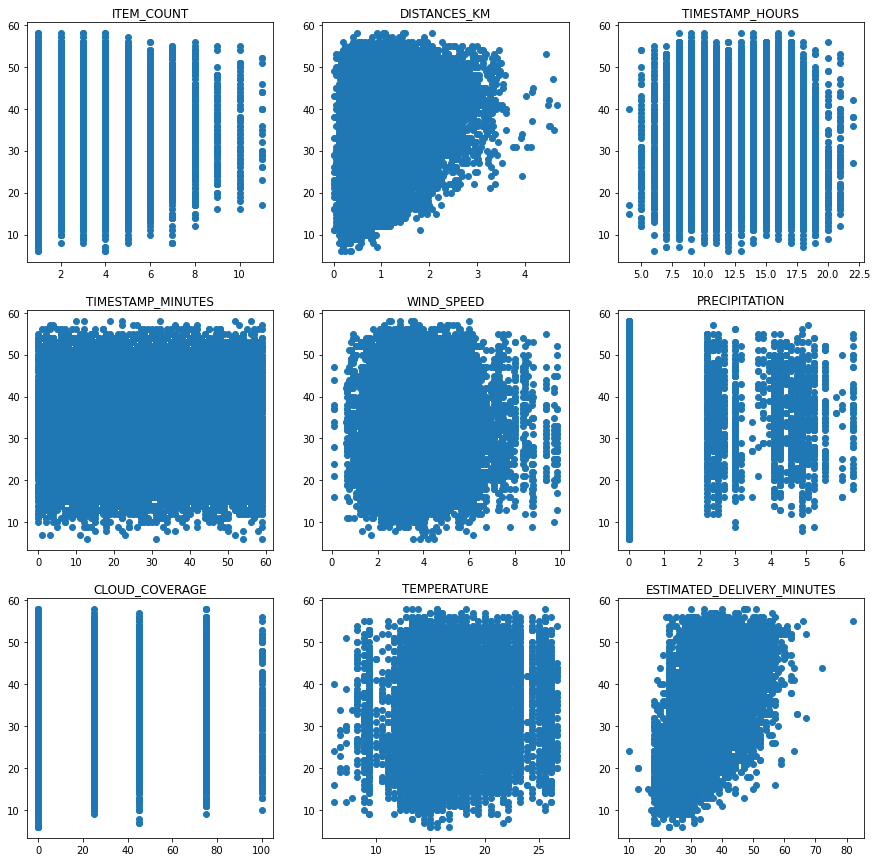

In [25]:
scatter_all_parameters(Y, data)

In [22]:
#reduce dimensionality to plot
from sklearn.decomposition import PCA
from sklearn.manifold import TSNE
x_values = X.values
pca = PCA(n_components=2)
#tsne = TSNE(n_components=3)
#reduced = tsne.fit_transform(x_values)

In [47]:
def regress_plot(X_train, Y_train, X_test, Y_test):
    regressor = LinearRegression()
    regressor.fit(X_train, Y_train)

    pred_train = regressor.predict(X_train)
    print("train loss")
    print(mean_squared_error(Y_train, pred_train))

    pred_test = regressor.predict(X_test).astype(np.uint8)
    print("test loss mse")
    print(mean_squared_error(Y_test, pred_test))

    print("test loss mae")
    print(mean_absolute_error(Y_test, pred_test))

    print(Y_test.shape, pred_test.shape)
    plt.plot(np.arange(Y_test.shape[0])[:,None], Y_test)
    plt.plot(np.arange(Y_test.shape[0])[:,None], pred_test)
    plt.show()



In [48]:
x_train, x_test = split_data(X.values, 0.7)
y_train, y_test = split_data(Y.values, 0.7)


y_test, y_val = split_data(y_test, 0.7)
x_test, x_val = split_data(x_test, 0.7)

print("y test len ", len(y_test))

def get_test_y_start_end(data_len, split_ratio=0.7):

    start = int(data_len * split_ratio)
    end = int(start + (data_len - start) * split_ratio)

    return start, end

y_estimate_start, y_estimate_end = get_test_y_start_end(len(Y.values), 0.7)
estimated_delivery = data["ESTIMATED_DELIVERY_MINUTES"].values[y_estimate_start:y_estimate_end]
estimated_delivery_loss = mean_squared_error(y_test, estimated_delivery)
print("estimated delivery loss ", estimated_delivery_loss)

y test len  3870
estimated delivery loss  85.88914728682171


train loss
73.98258450960438
test loss mse
74.07467700258398
test loss mae
6.974418604651163
(3870, 1) (3870, 1)


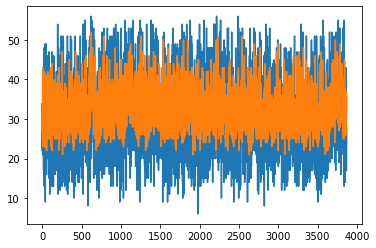

In [49]:

regress_plot(x_train, y_train, x_test, y_test)


0.5

[[1.]]
(5, 1)
[5 6 7 8 9]


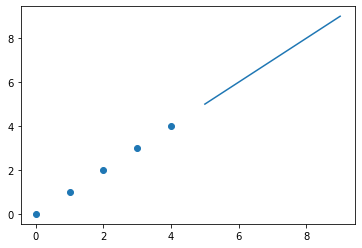

In [316]:
import numpy as np

range300 = np.arange(300)

test_regr = np.array([range300, range300])
regressor.fit(range300[:, None], range300[:,None])
print(regressor.coef_)
test = np.array([5,6,7,8,9])
pred = regressor.predict(test[:, None]).astype(np.uint8)
print(pred.shape)
print(test)
plt.scatter([0, 1, 2, 3, 4], [0, 1, 2, 3, 4])
plt.plot(test, pred[:,0])
plt.show()

In [ ]:
np.sqrt()